In [1]:
import pandas as pd
from bs4 import BeautifulSoup
from urllib.request import urlopen, Request
import time, datetime
import matplotlib.pyplot as plt
import re, math

from web_commons import extract_table_by_class, flatten_df, extract_compound_tables
from web_commons import fetch_scrip_data, extract_scrip_ratios, get_screener_data
from commons import read_xls, get_stock_data, NSE_BSE, save_csv, get_holding_quantities
from consts import CONSOLIDATED_NOT_AVAILABLE_ON_SCREENER, OUT_DIR

In [2]:
# OLD_CSV_DUMP = 'screener_dump_20240104214359.csv'
# OLD_CSV_DUMP = 'screener_dump_20240120055349.csv' ### TODO: pick last file automatically?
# OLD_CSV_DUMP = 'screener_dump_20240124064253.csv' ### removing spurious Nov2023 FII/DII data!!
# OLD_CSV_DUMP = 'screener_dump_20240130042728.csv'
# OLD_CSV_DUMP = 'screener_dump_20240216214621.csv'
OLD_CSV_DUMP = 'screener_dump_20240304165155.csv'

ATTRIBUTES = [
                'Return on Equity',  #'^ROE', # Just a flat number not time series
#               '\[ROE\]', # Just for BAJFINANCE
                'Compounded Profit Growth', 
                'Compounded Sales Growth', 
                'Stock Price CAGR',
                '\[NetProfit\]\[[JFMASOND]', 
                '\[NetProfit\]\[Qtr]', 
                '\[Sales\]\[[JFMASOND]', 
                '\[Sales\]\[Qtr]', 
                '\[EPSinRs\]\[[JFMASOND]', 
                '\[EPSinRs\]\[Qtr]',
                '\[Promoters\]\[[JFMASOND]',
                '\[FIIs\]\[[JFMASOND]',
                '\[DIIs\]\[[JFMASOND]',
                '\[Public\]\[[JFMASOND]'
]

df = pd.DataFrame()

In [3]:
def sort_cols(cols): 
    if re.findall("\[[JFMASOND][a-z]+[0-9]+\]", cols[0]):
        cols.sort(key=lambda x: datetime.datetime.strptime(x.rsplit('[', 1)[-1].replace(']', ''), '%b%Y'))

    return cols

def rename_col_names(df, cols, series=False):
#     col_name_maps = {c:c.replace(re.findall(g, c)[0], '').replace('[', '').replace(']', '') for c in cols}
    col_name_maps = {c:c.rsplit('[', 1)[-1].replace(']', '') for c in cols}
    df = df[cols]
    
    if series:
        df = df.rename(col_name_maps)
    else:
        df = df.rename(columns=col_name_maps)

    return df

def get_plot_dim():
    l = len(ATTRIBUTES)
    r = math.ceil(math.sqrt(l))+1
    c = math.ceil(l/r)
    
    return r, c

def get_title_from_attributes(attr):
    name = attr.split(']', 1)[0].replace('\\', '').replace('[', '') 
    if 'Qtr' in attr:
        name += 'Qtr'
    
    return name

def plot_attribute_per_scrip(df, png_folder_name='fundamental_data/', save_pngs=False):
    for attr in ATTRIBUTES:
        cols = [c for c in df.columns if re.findall(attr, c)]
        cols = sort_cols(cols)
        attr_df = rename_col_names(df, cols).T[get_holding_quantities().keys()].fillna(method='ffill')

        f = attr_df.plot(subplots=True, layout=(8, 3), figsize=(35, 20), grid=True, sharex=True, kind='bar')

        for ax in plt.gcf().axes:
            ax.legend(fontsize = 21, loc='upper left') #loc=1
            if attr == 'Return on Equity':
                ax.plot(attr_df.index.values.tolist(), [.2]*len(attr_df.index.values), c='g', linewidth=4)
            ax.tick_params(axis='x', which='both', labelsize=20)
            ax.tick_params(axis='y', which='both', labelsize=20)

        ax = f[0][0]
        fig = ax.get_figure()
        fig.tight_layout()
        fig.subplots_adjust(top=0.95)
        fig.suptitle(get_title_from_attributes(attr), fontsize=20)
        fig.patch.set_linewidth(10)
        fig.patch.set_edgecolor('cornflowerblue')
        
        if save_pngs:
            fig.savefig(f'{OUT_DIR}{png_folder_name}{get_title_from_attributes(attr)}.png') #, edgecolor=fig.get_edgecolor())
            print(f'Wrote: {OUT_DIR}{png_folder_name}{get_title_from_attributes(attr)}.png')

def plot_scrips_with_attributes(df, png_folder_name='fundamental_data/', save_pngs=False):
    for scrip in get_holding_quantities():
        nrows, ncols = get_plot_dim()
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(35, 20))
        fig.suptitle(scrip, fontsize=30)
        fig.tight_layout()
        fig.subplots_adjust(top=0.92, hspace=.3, wspace=.08)
        fig.patch.set_linewidth(10)
        fig.patch.set_edgecolor('cornflowerblue')

        df_c = df.loc[scrip]
        g_num = 0
        for i in range(nrows):
            for j in range(ncols):
                if g_num == len(ATTRIBUTES):
                    break

                attr = ATTRIBUTES[g_num] #'Return on Equity'
                cols = [c for c in df_c.keys() if re.findall(attr, c)]
                cols = sort_cols(cols)
                df1 = rename_col_names(df_c, cols, series=True)
                df1 = df1.fillna(method='ffill') #df1.dropna()
                axes[i][j].tick_params(axis='x', which='both', labelsize=12)
                axes[i][j].tick_params(axis='y', which='both', labelsize=15)
                
                
                df1.plot(ax=axes[i][j], title=get_title_from_attributes(attr), grid=True, kind='bar')
                axes[i][j].title.set_size(23)
                
                if attr == 'Return on Equity':
                    axes[i][j].plot(df1.index.values.tolist(), [.2]*len(df1.index.values), c='g', linewidth=4)
                    
                g_num += 1
                
        if save_pngs:
            fig.savefig(f'{OUT_DIR}{png_folder_name}{scrip}.png', bbox_inches='tight') #, edgecolor=fig.get_edgecolor())
            print(f'Wrote: {OUT_DIR}{png_folder_name}{scrip}.png')

def write_pngs_to_html(png_folder_name='fundamental_data/'):
    png_names = [get_title_from_attributes(g) for g in ATTRIBUTES]
    png_names += [s for s in get_holding_quantities()]
    
    html = "<!DOCTYPE html>\n"
    html += "<HTML>\n"
    html += "<BODY>\n"
    for p in png_names:
        html += '\t<img src="{}.png">\n'.format(p)
        html += '<BR>'
    html += "</BODY>"
    html += "</HTML>"

    with open(f"{OUT_DIR}{png_folder_name}index.html", "w") as html_file:
        html_file.write(html)

def add_data_from_prev_csv(curr_df, csv_name, index_col='Scrip'):
    df_prev = pd.read_csv(csv_name, index_col=index_col)
    old_not_in_new = list(set([c for c in df_prev.columns]) - set([c for c in curr_df.columns]))
    print(f'Adding old columns not in new data: {old_not_in_new}')
    
    for c in old_not_in_new:
        curr_df[c] = df_prev[c]
        
    return curr_df

********** BAJFINANCE
********** SONACOMS
********** DMART
********** DEEPAKNTR
********** KPITTECH
********** FINEORG
********** TATACHEM
********** NAUKRI
********** AFFLE
********** HAPPSTMNDS
********** DIVISLAB
********** BERGEPAINT
********** RAJRATAN
********** IONEXCHANG
********** PRINCEPIPE
********** DIXON
********** RELAXO
********** BEL
********** PRAJIND
********** LAURUSLABS
********** DEVYANI
********** GARFIBRES
********** RBA
Adding old columns not in new data: ['[Expenses][Qtr][Mar2020]', '[EPSinRs][Qtr][Sep2020]', '[Expenses][Qtr][Mar2019]', '[NetProfit][Qtr][Dec2019]', '[NetProfit][Qtr][Jun2020]', '[NetProfit][Qtr][Jun2019]', '[Depreciation][Qtr][Mar2020]', '[Sales][Qtr][Jun2019]', '[Sales][Qtr][Mar2020]', '[OtherIncome][Qtr][Sep2020]', '[RawPDF][Qtr][Mar2019]', '[Depreciation][Qtr][Sep2020]', '[OtherIncome][Qtr][Jun2019]', '[OtherIncome][Qtr][Jun2020]', '[Tax][Qtr][Sep2020]', '[Sales][Qtr][Jun2020]', '[Expenses][Qtr][Sep2019]', '[NetProfit][Qtr][Sep2019]', '[Inter

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/Return on Equity.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/Compounded Profit Growth.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/Compounded Sales Growth.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/Stock Price CAGR.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/NetProfit.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/NetProfitQtr.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/Sales.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/SalesQtr.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/EPSinRs.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/EPSinRsQtr.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/Promoters.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/FIIs.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/DIIs.png


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/Public.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/BAJFINANCE.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/SONACOMS.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/DMART.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/DEEPAKNTR.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/KPITTECH.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/FINEORG.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/TATACHEM.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/NAUKRI.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/outputs/fundamental_data/AFFLE.png
Wrote: /Users/aniron/Documents/Tracked/PyHelloWorld/docs/o

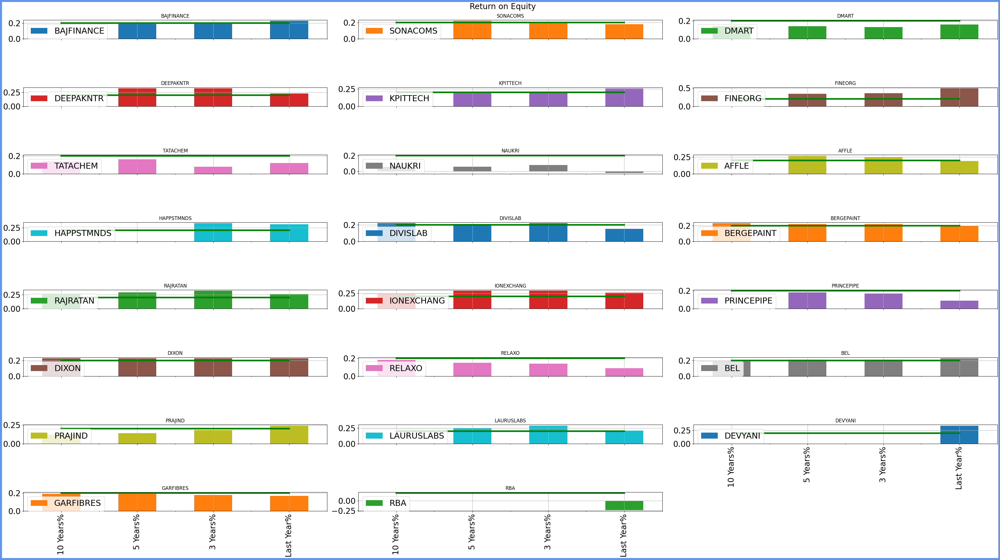

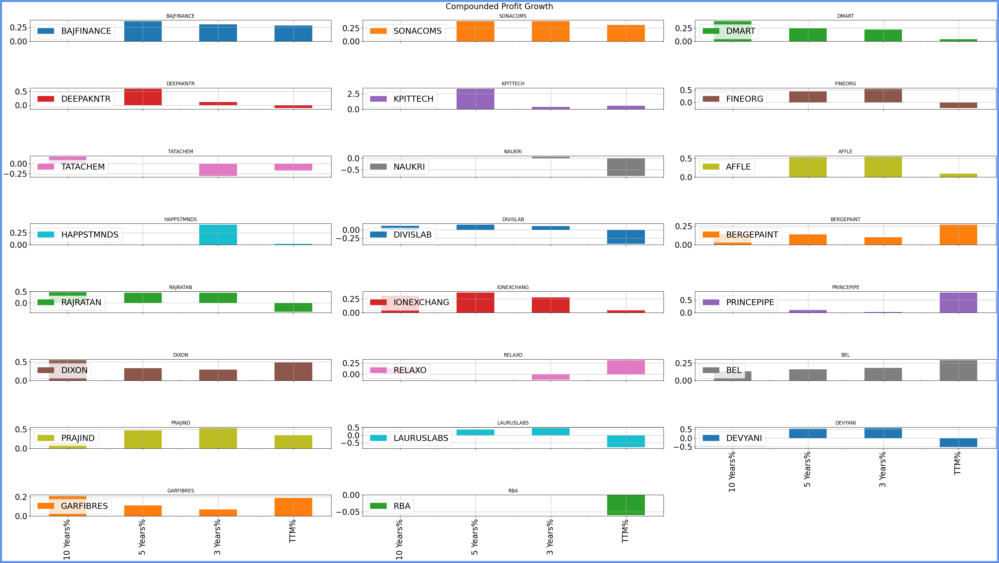

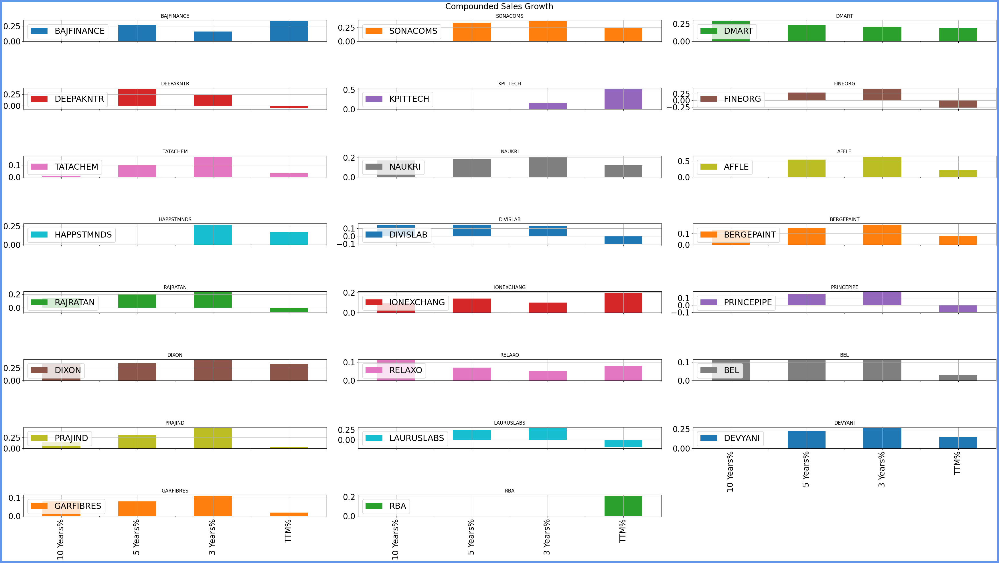

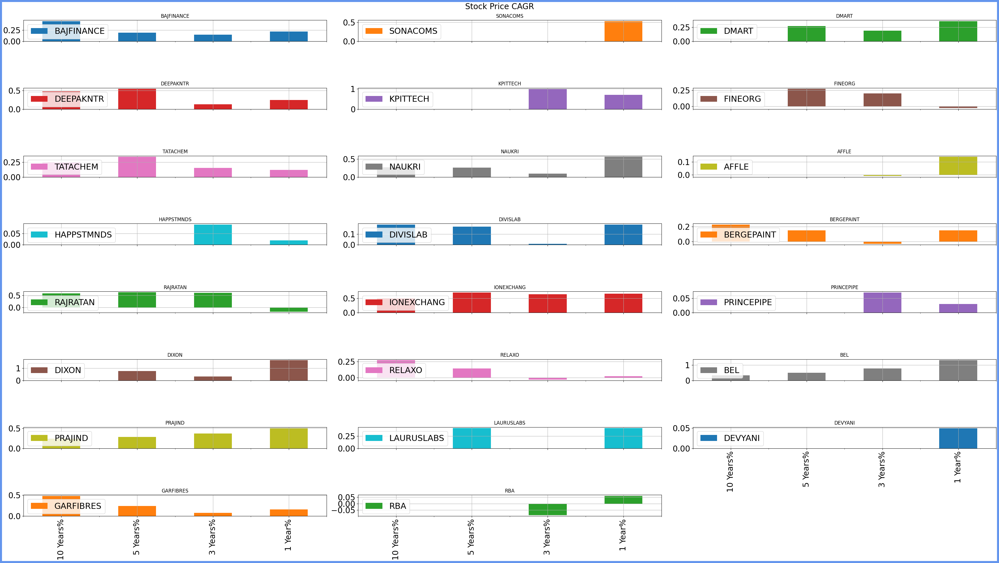

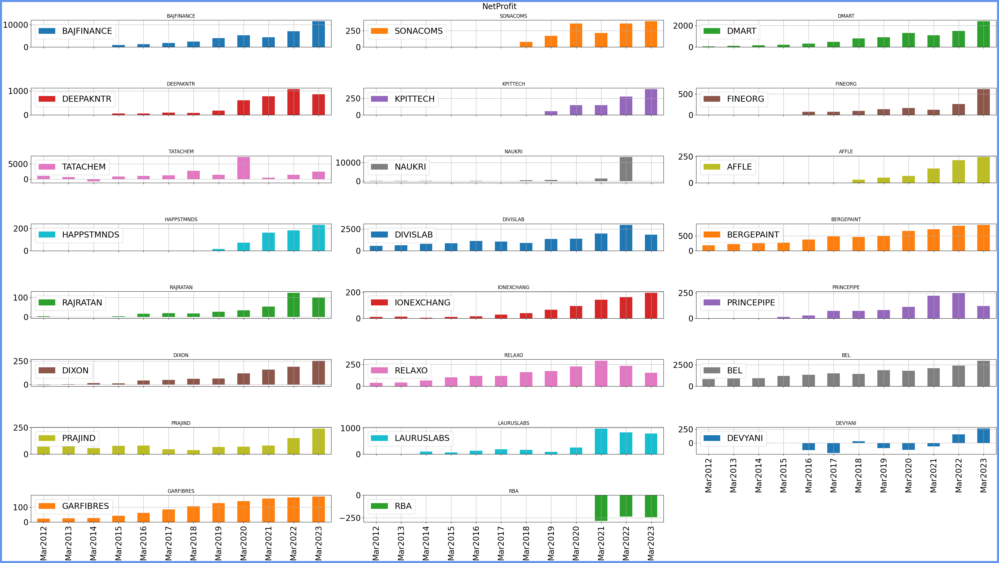

...

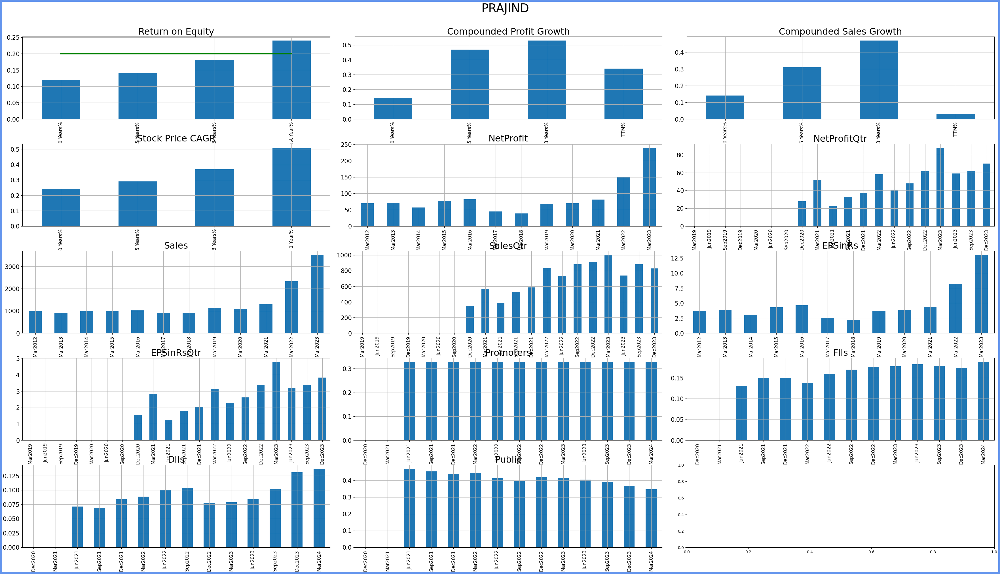

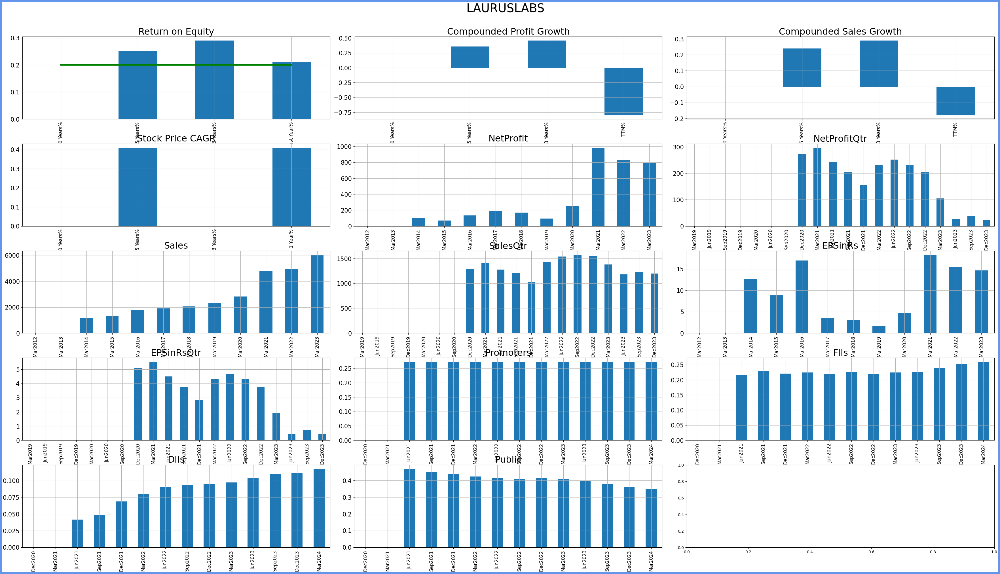

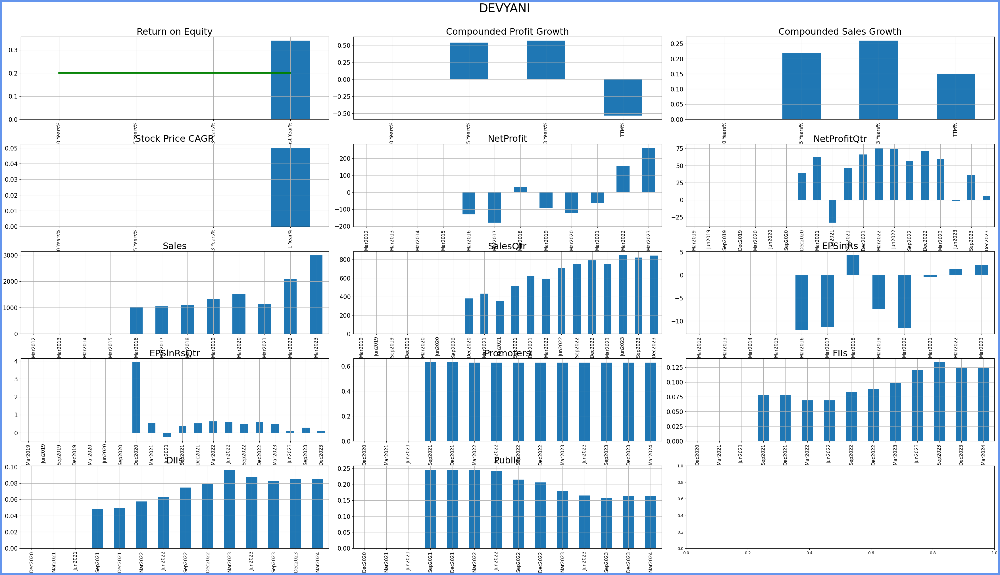

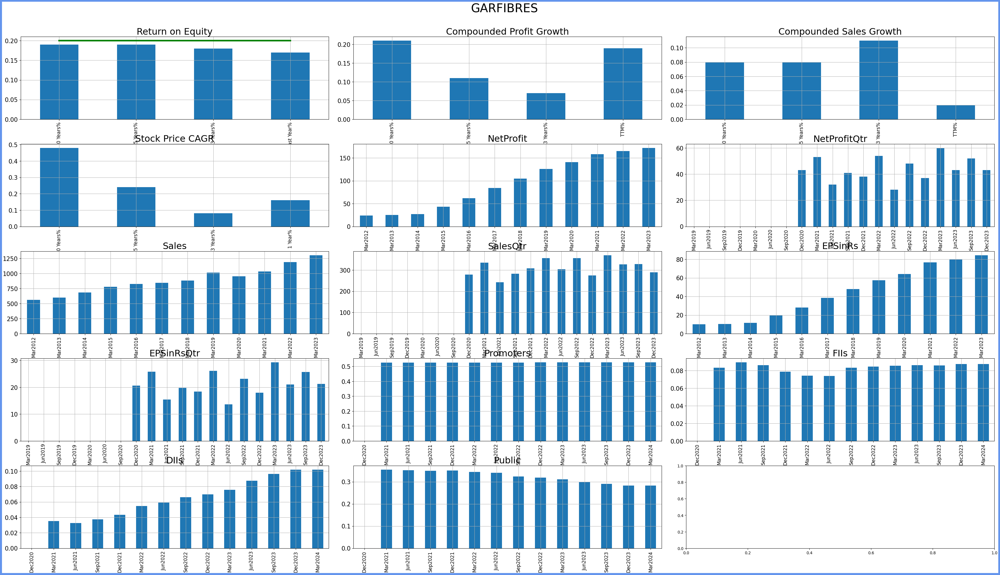

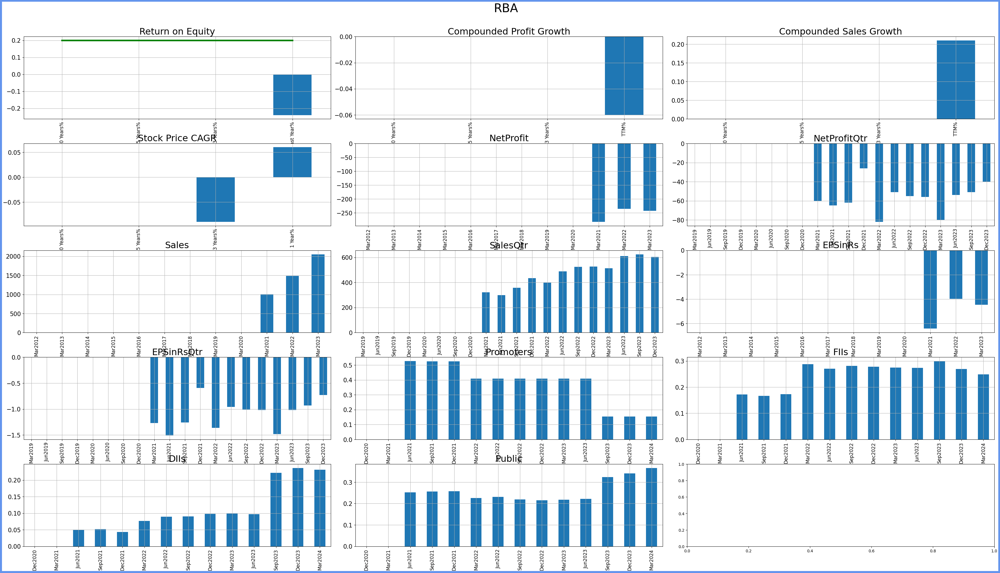

In [4]:
if df.empty:
    df = get_screener_data()
else:
    print('df already loaded, using from cache!')

### TODO - add only old cols, not the updated ones like Nov2023 FII/DII data!
df = add_data_from_prev_csv(df, f'{OUT_DIR}{OLD_CSV_DUMP}') 

save_csv(df, 'screener_dump')

plot_attribute_per_scrip(df, save_pngs=True)
plot_scrips_with_attributes(df, save_pngs=True)
write_pngs_to_html()

In [5]:
# df = get_screener_data(scrips = ['BAJFINANCE', 'DMART', 'DEEPAKNTR', 'SONACOMS'])

In [6]:
attr = '\[FIIs\]\[[JFMASOND]'
cols = [c for c in df.columns if re.findall(attr, c)]
cols = sort_cols(cols)

print(df[cols])
attr_df = rename_col_names(df, cols).T[['BAJFINANCE', 'DMART', 'DEEPAKNTR', 'SONACOMS']].fillna(method='ffill')
attr_df

# f = attr_df.plot(subplots=True, layout=(2,2), figsize=(35,20), grid=True, sharex=False)
# # attr_df.loc[:, :] = .25
# # f = f.plot(subplots=True, layout=(2,2), figsize=(35,20), grid=True, sharex=False)
# # plt.tight_layout()

# for ax in plt.gcf().axes:
#     ax.legend(fontsize = 25, loc='upper right') #loc=1
# #     print(dir(ax))
# #     print(ax.get_xticks())
# #     ax.set_ylabel('crapppp')
#     ax.plot(attr_df.index.values.tolist(), [.2]*len(attr_df.index.values), c='g', linewidth=4)
#     ax.tick_params(axis='x', which='both', labelsize=20)
#     ax.tick_params(axis='y', which='both', labelsize=20)


# #     plt.xticks(fontsize = 15)
    

# # for i in range(2):
# #     for j in range(2):
# #         f[i][j].plot([])
# #         df1.plot(ax=axes[i][j], title=get_title_from_attributes(attr), grid=True)



# ax = f[0][0]
# fig = ax.get_figure()
# fig.tight_layout()
# fig.subplots_adjust(top=0.95)

# fig.suptitle(get_title_from_attributes(attr), fontsize=20)
# fig.patch.set_linewidth(10)
# fig.patch.set_edgecolor('cornflowerblue')

# f

            [FIIs][Dec2020]  [FIIs][Mar2021]  [FIIs][Jun2021]  \
Scrip                                                           
BAJFINANCE              NaN           0.2406           0.2403   
SONACOMS                NaN              NaN           0.1389   
DMART                   NaN           0.1017           0.1004   
DEEPAKNTR               NaN              NaN           0.1143   
KPITTECH                NaN              NaN           0.1982   
FINEORG              0.0638           0.0593           0.0680   
TATACHEM                NaN           0.1403           0.1302   
NAUKRI                  NaN           0.3933           0.3774   
AFFLE                   NaN              NaN           0.1825   
HAPPSTMNDS              NaN           0.0707           0.0623   
DIVISLAB                NaN           0.1987           0.2060   
BERGEPAINT              NaN           0.1124           0.1125   
RAJRATAN                NaN           0.0000           0.0002   
IONEXCHANG              N

Scrip,BAJFINANCE,DMART,DEEPAKNTR,SONACOMS
Dec2020,NaN,NaN,NaN,NaN
Mar2021,0.2406,0.1017,NaN,NaN
Jun2021,0.2403,0.1004,0.1143,0.1389
Sep2021,0.2364,0.0995,0.1085,0.1038
Dec2021,0.2285,0.0944,0.0884,0.0977
Mar2022,0.2141,0.0883,0.0876,0.0879
Jun2022,0.1998,0.0859,0.0907,0.0880
Sep2022,0.2049,0.0872,0.0845,0.1156
Dec2022,0.1987,0.0863,0.0872,0.1127
Mar2023,0.1916,0.0817,0.0772,0.2469


In [7]:
# attr_df = rename_col_names(df, cols).T[['BAJFINANCE', 'DMART', 'DEEPAKNTR', 'SONACOMS']].fillna(method='ffill')
# print(attr_df.columns)
# attr_df.loc[:, :] = .25
# attr_df.index.values.tolist()

Dec2020       NaN
Mar2021    0.0826
Jun2021    0.0826
Sep2021    0.0829
Dec2021    0.0883
Mar2022    0.0942
Jun2022    0.0952
Sep2022    0.0923
Dec2022    0.0924
Mar2023    0.0937
Jun2023    0.0949
Sep2023    0.0941
Dec2023    0.0887
Mar2024    0.0887
Name: DMART, dtype: float64


<AxesSubplot:title={'center':'FIIs'}>

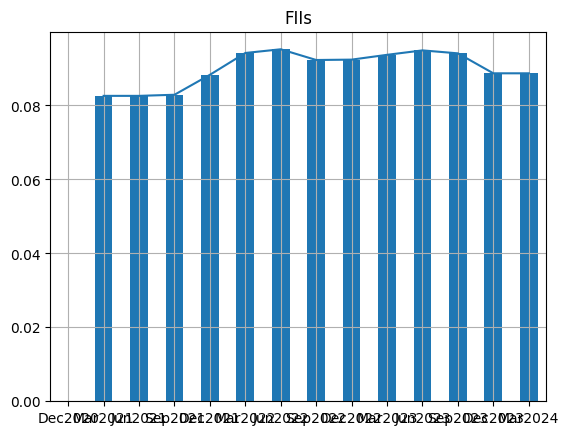

In [8]:
attr = '\[FIIs\]\[[JFMASOND]'
# # for scrip, q in get_holding_quantities():
# #     print(scrip, q)
# # get_holding_quantities()
df_c = df.loc['DMART']
cols = [c for c in df_c.keys() if re.findall('\[Public\]\[[JFMASOND]', c)]
cols = sort_cols(cols)

# print(cols)
df1 = rename_col_names(df_c, cols, series=True)
# df1=df1.dropna()
df1 = df1.fillna(method='ffill')
print(df1)
df1.plot(title=get_title_from_attributes(attr), grid=True, kind='bar')
df1.plot(title=get_title_from_attributes(attr), grid=True)





In [9]:
# save_csv(df, 'screener_dump')

In [10]:
df.drop('BAJFINANCE')
df.drop('NAUKRI')


df

,Market Cap,Current Price,High / Low,Stock P/E,Book Value,Dividend Yield,ROCE,ROE,Face Value,[Sales][Mar2015],...,[Interest][Qtr][Jun2020],[GrossNPA][Qtr][Sep2020],[Expenses][Qtr][Jun2020],[OperatingProfit][Qtr][Dec2019],[Tax][Qtr][Mar2020],[Profitbeforetax][Qtr][Sep2020],[EPSinRs][Qtr][Jun2020],[Sales][Qtr][Dec2019],[Sales][Qtr][Sep2020],[RawPDF][Qtr][Dec2019]
Scrip,,,,,,,,,,,,,,,,,,,,,
BAJFINANCE,447578.0,7230.0,8192.0,32.5,969.00,0.41,11.80,23.50,2.0,5392.0,...,NaN,0.0103,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SONACOMS,39878.0,680.0,719.0,80.2,41.50,0.41,22.00,18.30,10.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DMART,310172.0,4765.0,4832.0,128.0,268.00,0.00,20.10,16.00,10.0,6439.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DEEPAKNTR,31605.0,2317.0,2521.0,40.0,318.00,0.32,29.70,22.70,2.0,1327.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
KPITTECH,40456.0,1475.0,1764.0,74.9,67.80,0.28,30.20,25.70,10.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FINEORG,13348.0,4348.0,5165.0,29.9,559.00,0.21,65.30,49.40,5.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TATACHEM,29308.0,1148.0,1350.0,16.9,840.00,1.52,11.60,12.00,10.0,17204.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NAUKRI,77288.0,5974.0,6355.0,366.0,1524.00,0.32,2.76,-1.64,10.0,732.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AFFLE,14997.0,1070.0,1337.0,55.1,114.00,0.00,20.20,18.50,2.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
cols = ['[NetProfit][Qtr][Sep2020]', '[NetProfit][Qtr][Dec2020]', '[NetProfit][Qtr][Mar2021]', 
        '[NetProfit][Qtr][Jun2021]', '[NetProfit][Qtr][Sep2021]', '[NetProfit][Qtr][Dec2021]', 
        '[NetProfit][Qtr][Mar2022]', '[NetProfit][Qtr][Jun2022]', '[NetProfit][Qtr][Sep2022]', 
        '[NetProfit][Qtr][Dec2022]', '[NetProfit][Qtr][Mar2023]', '[NetProfit][Qtr][Jun2023]', 
        '[NetProfit][Qtr][Sep2023]', '[NetProfit][Qtr][Mar2019]', '[NetProfit][Qtr][Jun2019]', 
        '[NetProfit][Qtr][Sep2019]', '[NetProfit][Qtr][Dec2019]', '[NetProfit][Qtr][Mar2020]', 
        '[NetProfit][Qtr][Jun2020]']

# my_strings.sort(key=lambda date: datetime.strptime(date, '%d.%m.%y time %H.%M'))
d = cols[0].rsplit('[', 1)[-1].replace(']', '')
print(d)
datetime.datetime.strptime(d, '%b%Y')
cols.sort(key=lambda x: datetime.datetime.strptime(x.rsplit('[', 1)[-1].replace(']', ''), '%b%Y'))
cols




Sep2020


['[NetProfit][Qtr][Mar2019]',
 '[NetProfit][Qtr][Jun2019]',
 '[NetProfit][Qtr][Sep2019]',
 '[NetProfit][Qtr][Dec2019]',
 '[NetProfit][Qtr][Mar2020]',
 '[NetProfit][Qtr][Jun2020]',
 '[NetProfit][Qtr][Sep2020]',
 '[NetProfit][Qtr][Dec2020]',
 '[NetProfit][Qtr][Mar2021]',
 '[NetProfit][Qtr][Jun2021]',
 '[NetProfit][Qtr][Sep2021]',
 '[NetProfit][Qtr][Dec2021]',
 '[NetProfit][Qtr][Mar2022]',
 '[NetProfit][Qtr][Jun2022]',
 '[NetProfit][Qtr][Sep2022]',
 '[NetProfit][Qtr][Dec2022]',
 '[NetProfit][Qtr][Mar2023]',
 '[NetProfit][Qtr][Jun2023]',
 '[NetProfit][Qtr][Sep2023]']

In [12]:
g = '\[NetProfit\]\[Qtr]'
c = '[NetProfit][Qtr][Mar2019]'
# g = '\[Sales\]\[[JFMASOND]'
c = '[Sales][Mar2012]'
c = '[Return on Equity][10 Years]%'
# c.replace(re.findall(g, c)[0], '').replace('[', '').replace(']', '')
c.rsplit('[', 1)[-1].replace(']', '')
g.split(']', 1)[0].replace('\\', '').replace('[', '')

g.split(']', 1)[0].replace('\\', '').replace('[', '') 

'NetProfit'

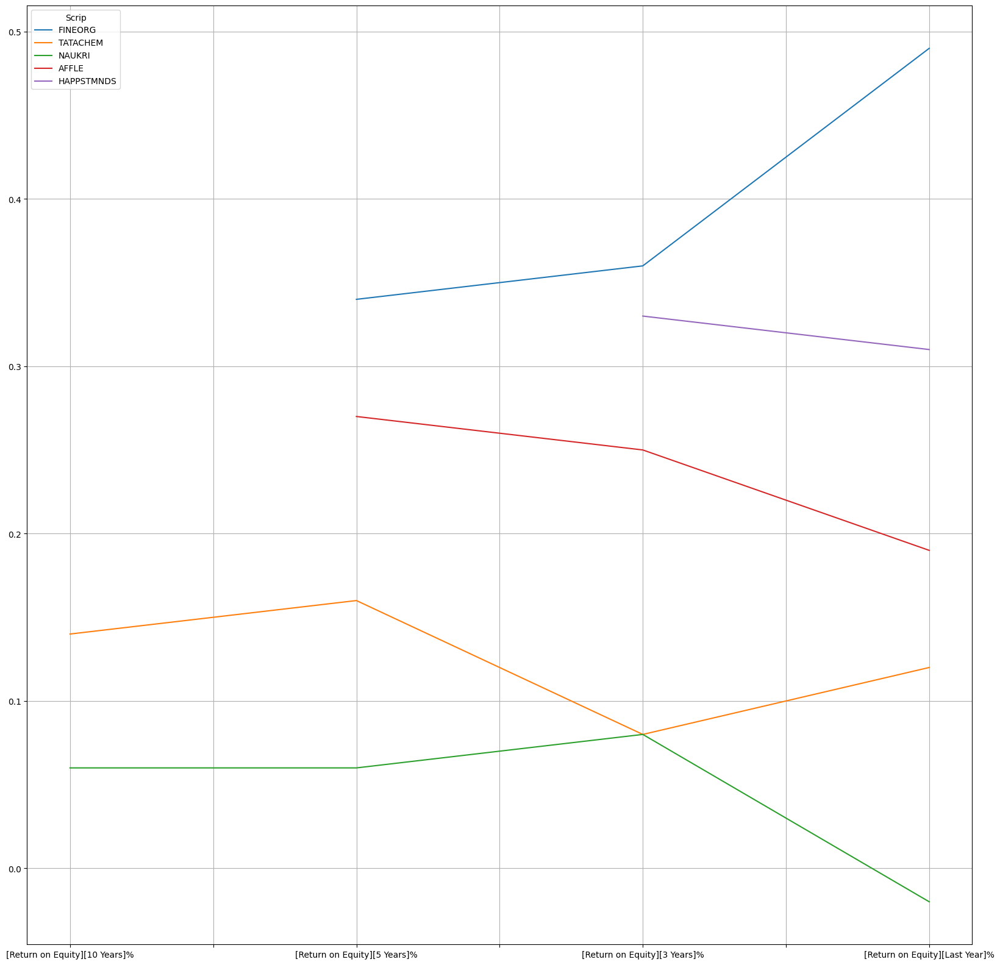

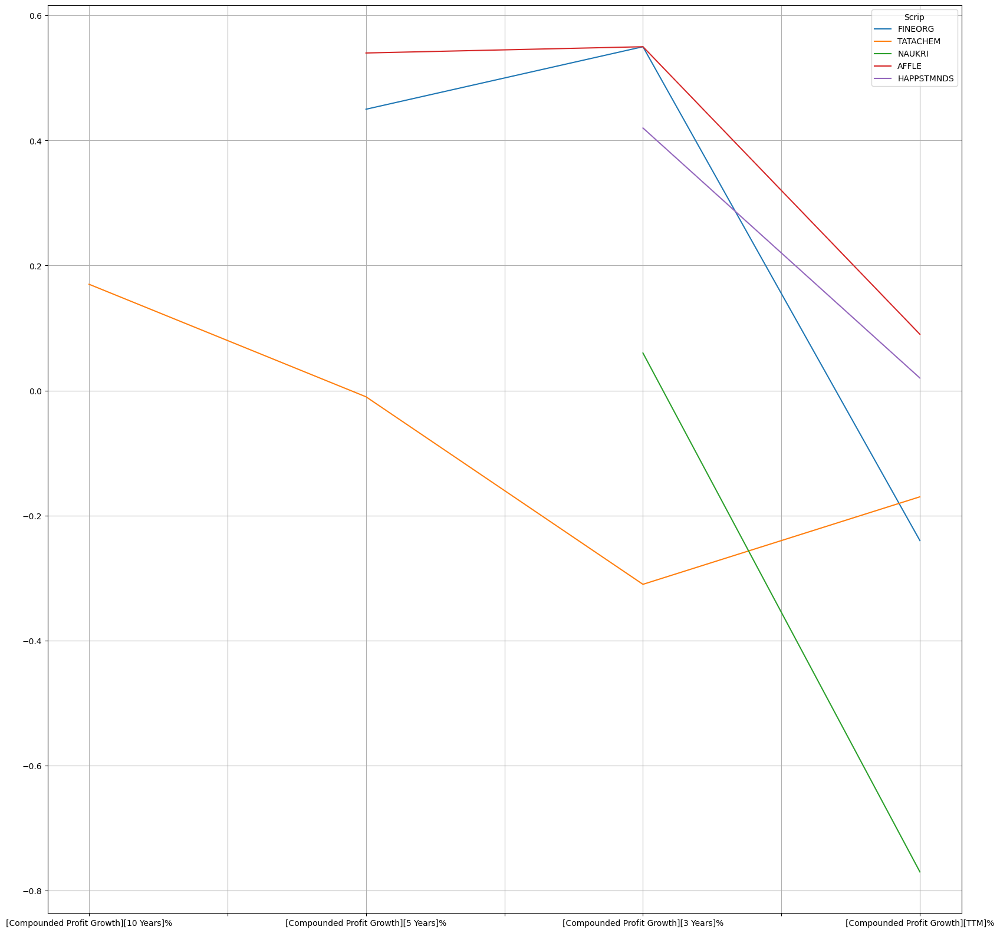

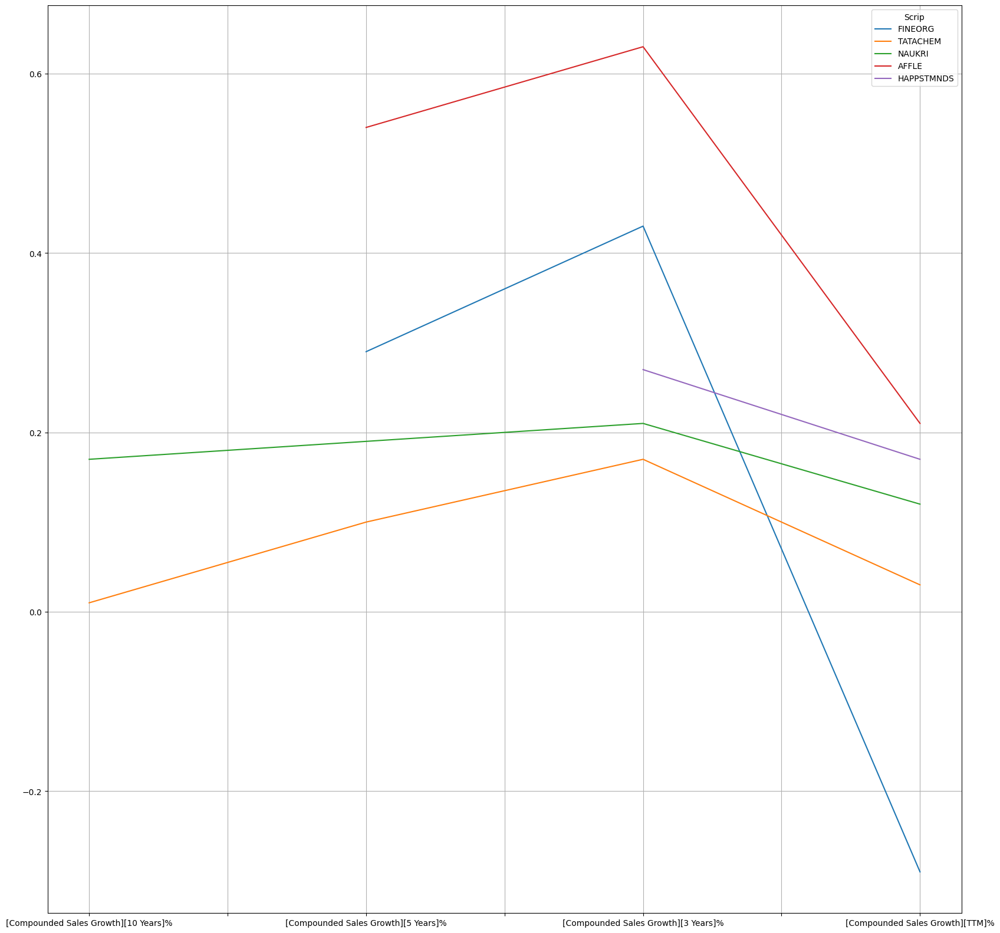

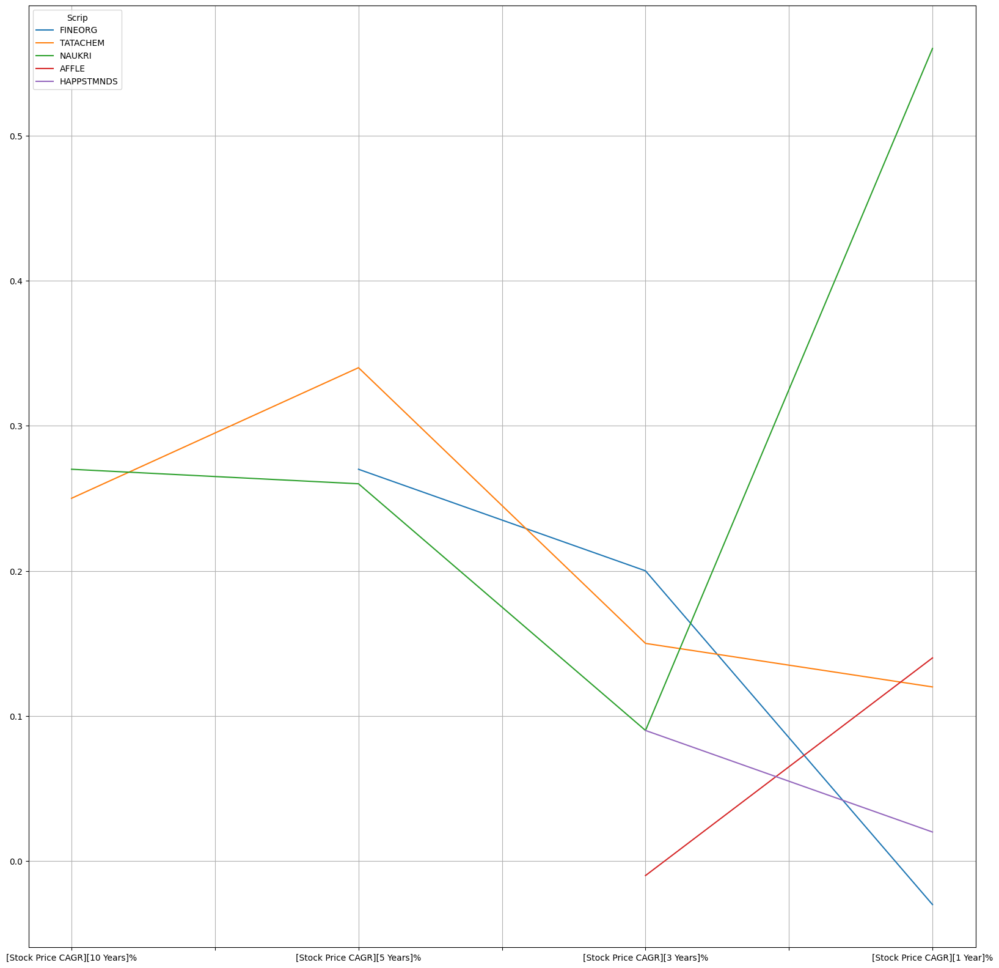

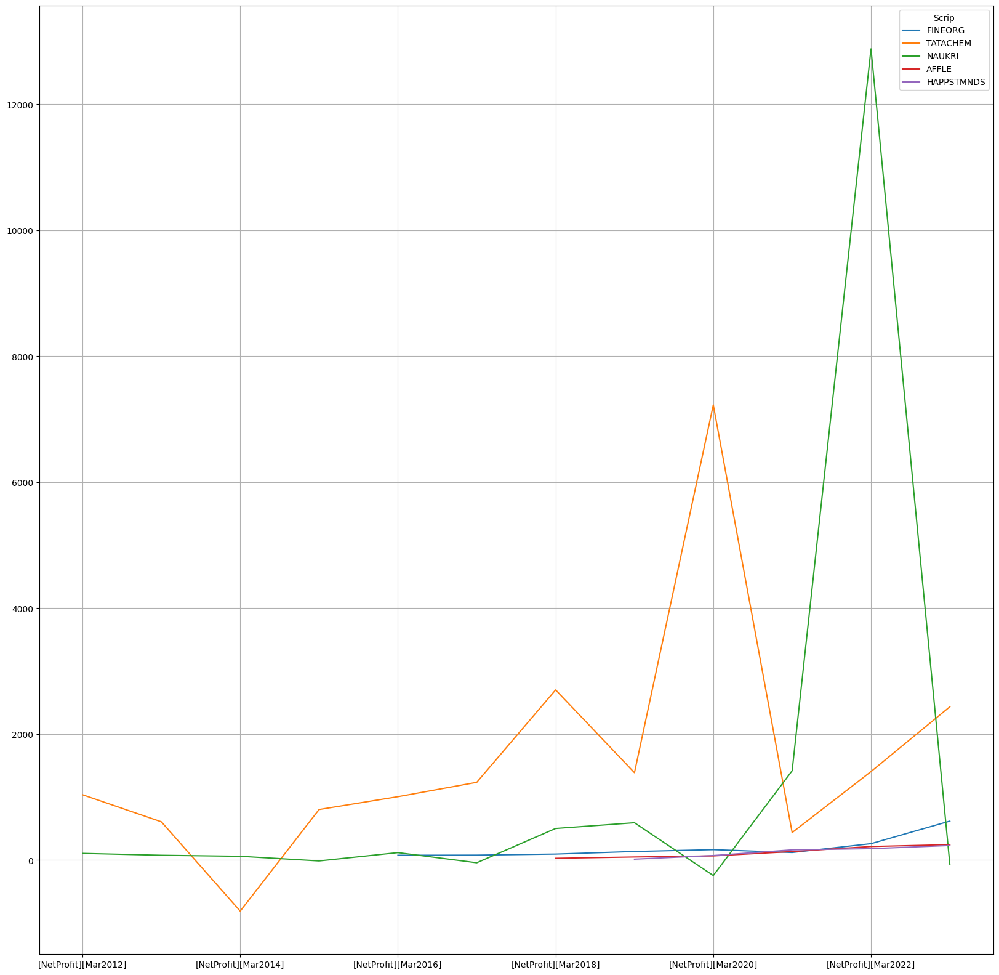

...

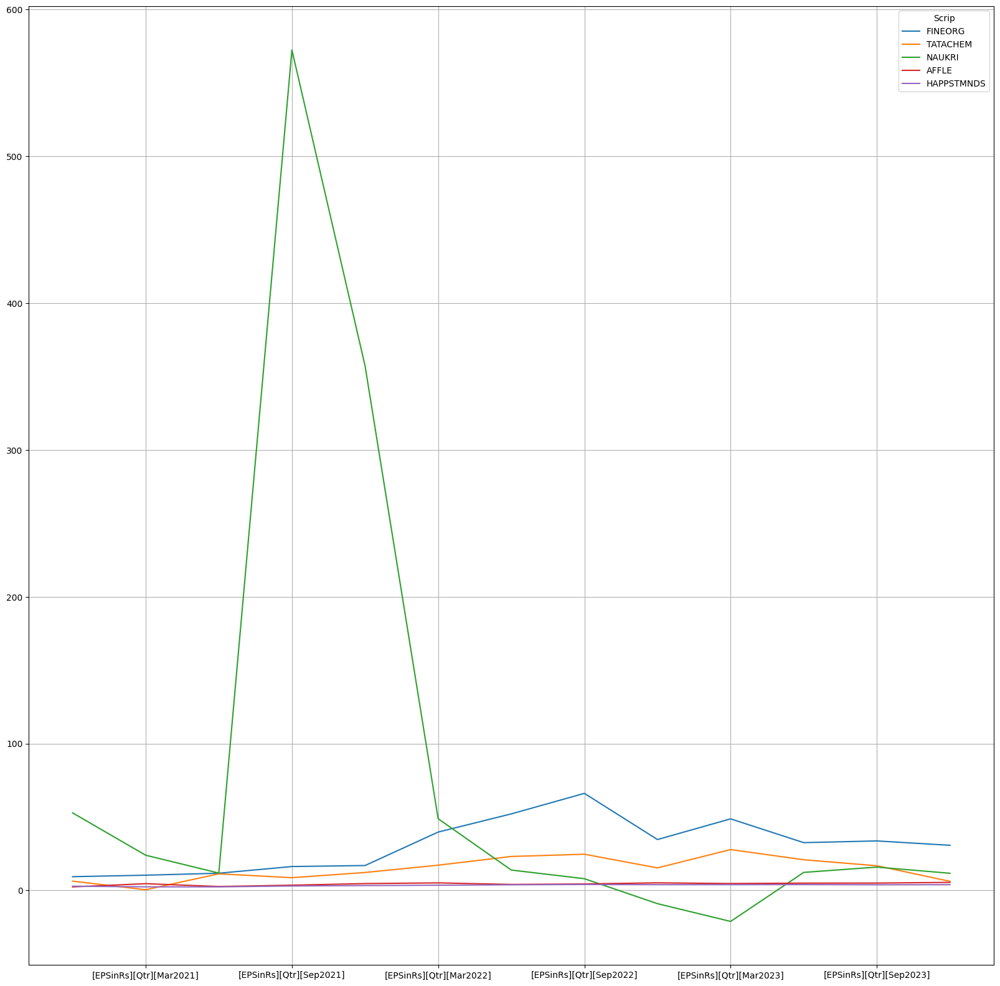

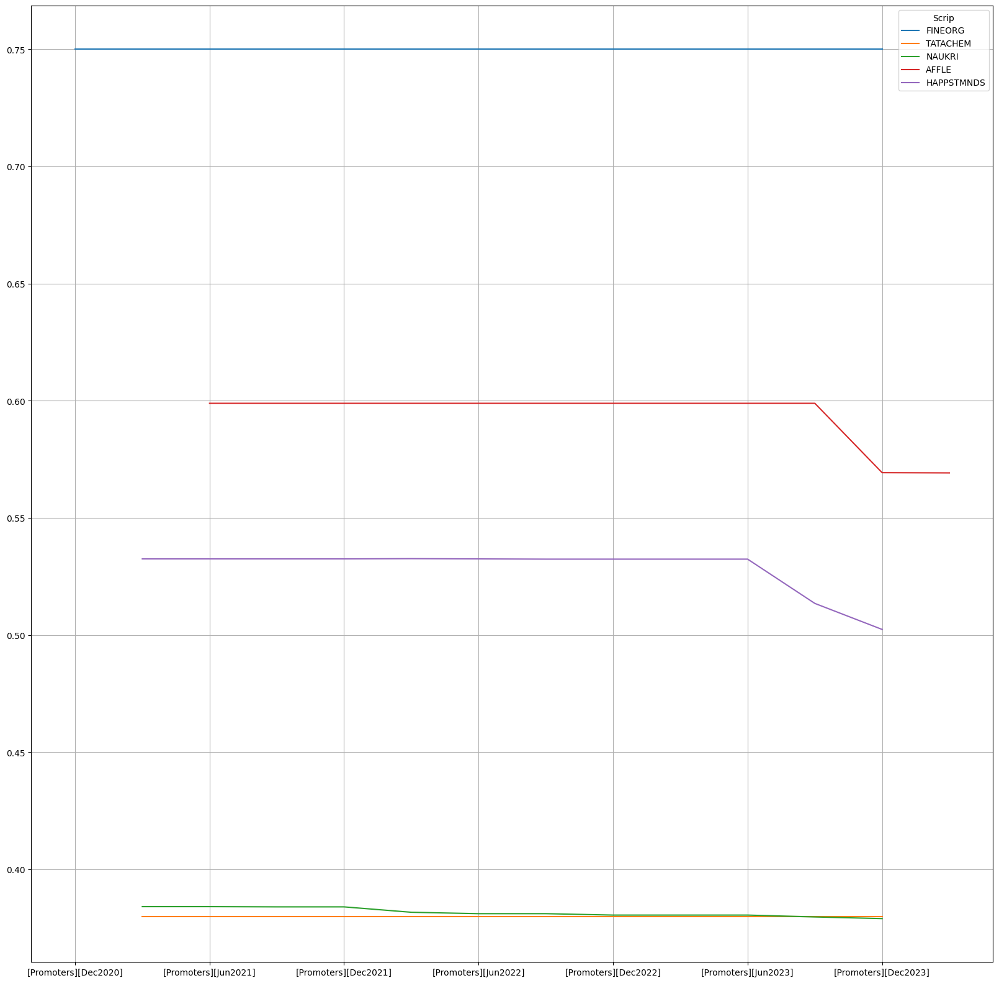

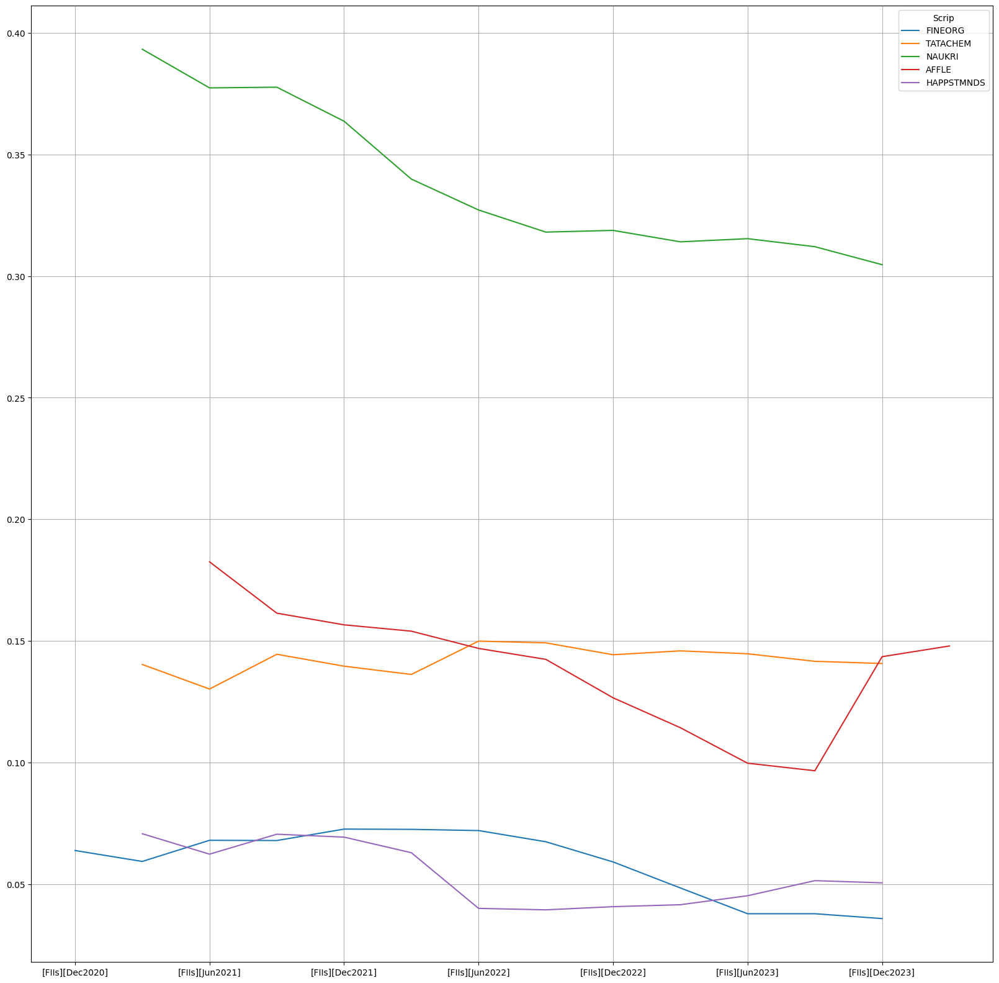

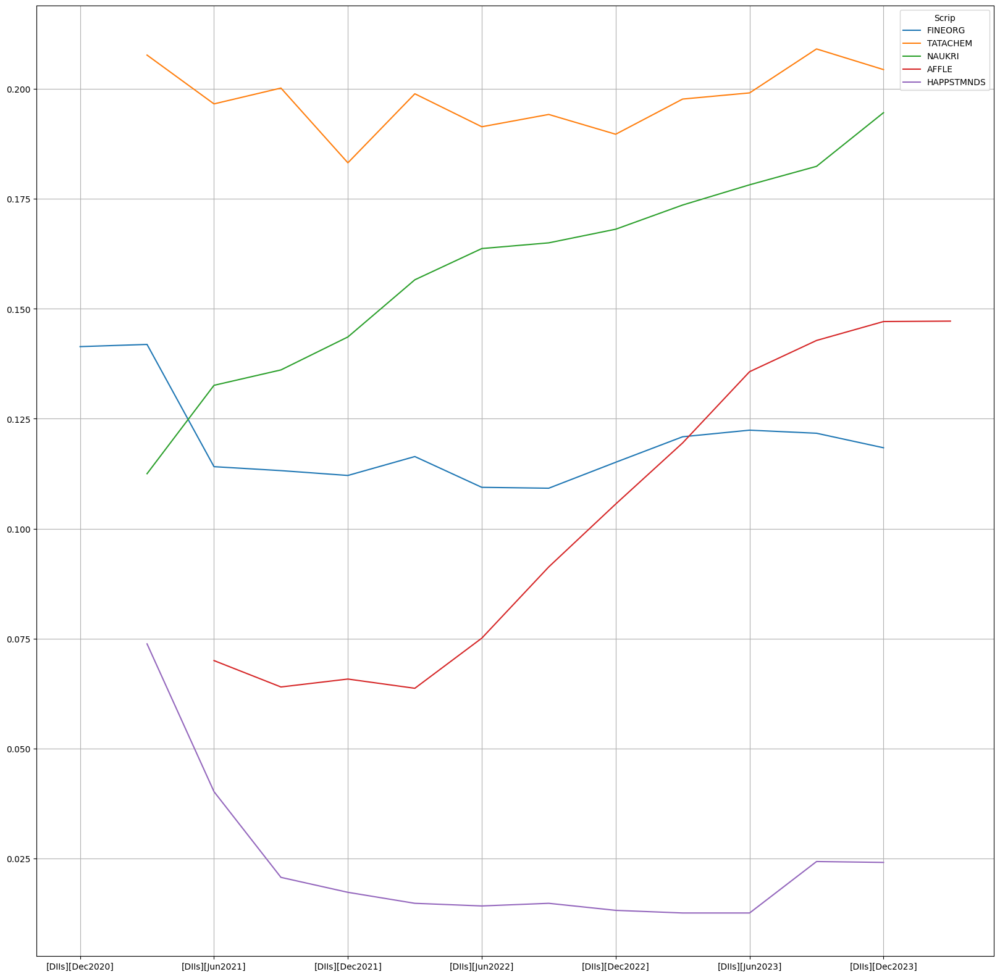

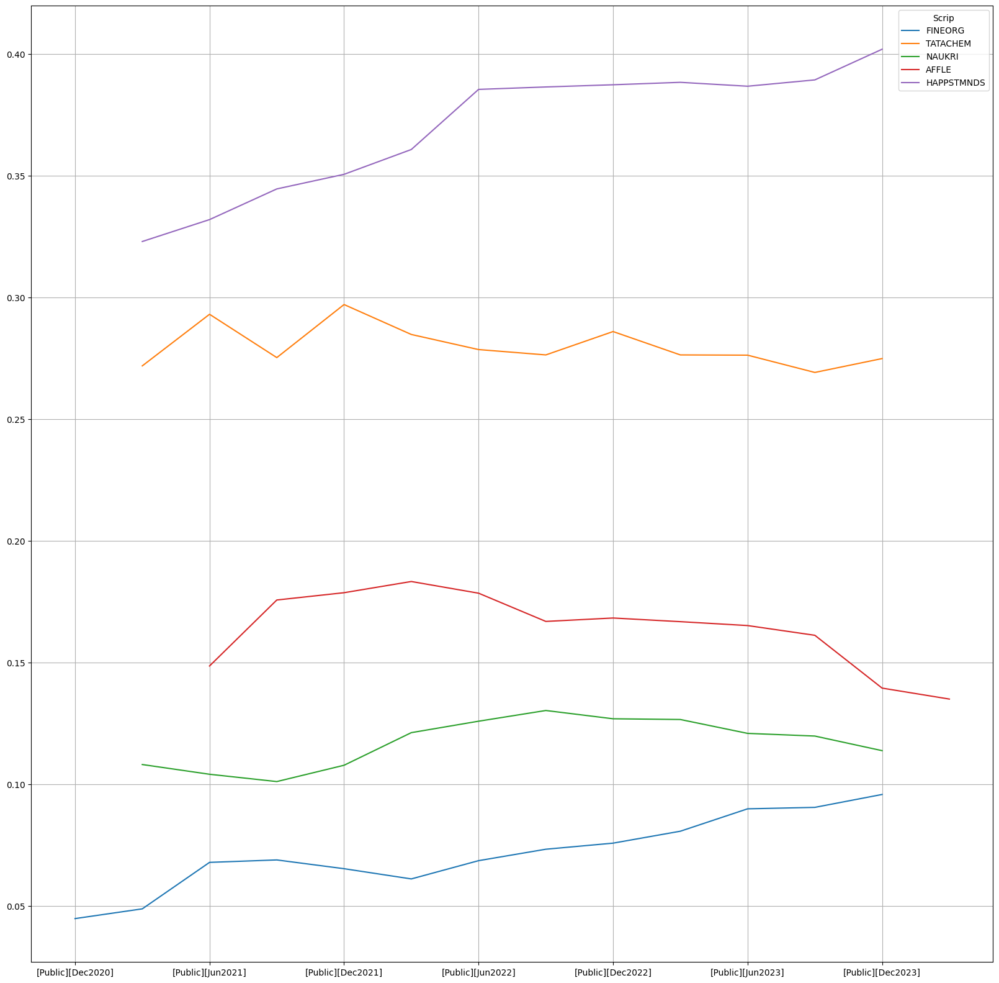

In [13]:
for attr in ATTRIBUTES:
    cols = [c for c in df.columns if re.findall(attr, c)]
    cols = sort_cols(cols)
    df[5:10][cols].T.plot(grid=True, figsize=(20,20)) # partial graph

[Public][Dec2020]       NaN
[Public][Mar2021]    0.1057
[Public][Jun2021]     0.104
[Public][Sep2021]    0.1042
[Public][Dec2021]    0.1091
[Public][Mar2022]    0.1115
[Public][Jun2022]    0.1184
[Public][Sep2022]    0.1126
[Public][Dec2022]     0.116
[Public][Mar2023]    0.1175
[Public][Jun2023]    0.1099
[Public][Sep2023]     0.105
[Public][Dec2023]    0.1017
[Public][Mar2024]       NaN
Name: BAJFINANCE, dtype: object

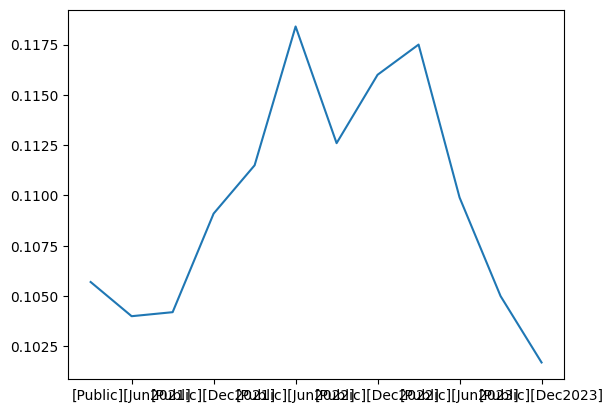

In [14]:
df.loc['BAJFINANCE'][['Market Cap', 'Current Price']]

dict(df.loc['BAJFINANCE']).keys()
df.loc['BAJFINANCE'][cols].plot()
df.loc['BAJFINANCE'][cols]